In [1]:
import pandas as pd 
import numpy as np 
from sklearn.preprocessing import StandardScaler 
from sklearn.linear_model  import Ridge,Lasso,RidgeCV, LassoCV, ElasticNet, ElasticNetCV, LogisticRegression
from sklearn.model_selection import train_test_split
from statsmodels.stats.outliers_influence import variance_inflation_factor 
from sklearn.metrics import accuracy_score, confusion_matrix, roc_curve, roc_auc_score
import matplotlib.pyplot as plt
import seaborn as sns

In [6]:
df=pd.read_csv('covtype.csv')
df.head()

,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Hillshade_3pm,Horizontal_Distance_To_Fire_Points,...,Soil_Type32,Soil_Type33,Soil_Type34,Soil_Type35,Soil_Type36,Soil_Type37,Soil_Type38,Soil_Type39,Soil_Type40,Cover_Type
0,2596,51,3,258,0,510,221,232,148,6279,...,0,0,0,0,0,0,0,0,0,5
1,2590,56,2,212,-6,390,220,235,151,6225,...,0,0,0,0,0,0,0,0,0,5
2,2804,139,9,268,65,3180,234,238,135,6121,...,0,0,0,0,0,0,0,0,0,2
3,2785,155,18,242,118,3090,238,238,122,6211,...,0,0,0,0,0,0,0,0,0,2
4,2595,45,2,153,-1,391,220,234,150,6172,...,0,0,0,0,0,0,0,0,0,5


In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 581012 entries, 0 to 581011
Data columns (total 55 columns):
 #   Column                              Non-Null Count   Dtype
---  ------                              --------------   -----
 0   Elevation                           581012 non-null  int64
 1   Aspect                              581012 non-null  int64
 2   Slope                               581012 non-null  int64
 3   Horizontal_Distance_To_Hydrology    581012 non-null  int64
 4   Vertical_Distance_To_Hydrology      581012 non-null  int64
 5   Horizontal_Distance_To_Roadways     581012 non-null  int64
 6   Hillshade_9am                       581012 non-null  int64
 7   Hillshade_Noon                      581012 non-null  int64
 8   Hillshade_3pm                       581012 non-null  int64
 9   Horizontal_Distance_To_Fire_Points  581012 non-null  int64
 10  Wilderness_Area1                    581012 non-null  int64
 11  Wilderness_Area2                    581012 non-null 

In [10]:
df.describe()

,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Hillshade_3pm,Horizontal_Distance_To_Fire_Points,...,Soil_Type32,Soil_Type33,Soil_Type34,Soil_Type35,Soil_Type36,Soil_Type37,Soil_Type38,Soil_Type39,Soil_Type40,Cover_Type
count,581012.000000,581012.000000,581012.000000,581012.000000,581012.000000,581012.000000,581012.000000,581012.000000,581012.000000,581012.000000,...,581012.000000,581012.000000,581012.000000,581012.000000,581012.000000,581012.000000,581012.000000,581012.000000,581012.000000,581012.000000
mean,2959.365301,155.656807,14.103704,269.428217,46.418855,2350.146611,212.146049,223.318716,142.528263,1980.291226,...,0.090392,0.077716,0.002773,0.003255,0.000205,0.000513,0.026803,0.023762,0.015060,2.051471
std,279.984734,111.913721,7.488242,212.549356,58.295232,1559.254870,26.769889,19.768697,38.274529,1324.195210,...,0.286743,0.267725,0.052584,0.056957,0.014310,0.022641,0.161508,0.152307,0.121791,1.396504
min,1859.000000,0.000000,0.000000,0.000000,-173.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
25%,2809.000000,58.000000,9.000000,108.000000,7.000000,1106.000000,198.000000,213.000000,119.000000,1024.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
50%,2996.000000,127.000000,13.000000,218.000000,30.000000,1997.000000,218.000000,226.000000,143.000000,1710.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000
75%,3163.000000,260.000000,18.000000,384.000000,69.000000,3328.000000,231.000000,237.000000,168.000000,2550.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000
max,3858.000000,360.000000,66.000000,1397.000000,601.000000,7117.000000,254.000000,254.000000,254.000000,7173.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,7.000000


In [12]:
df.isna().sum()

Elevation                             0
Aspect                                0
Slope                                 0
Horizontal_Distance_To_Hydrology      0
Vertical_Distance_To_Hydrology        0
Horizontal_Distance_To_Roadways       0
Hillshade_9am                         0
Hillshade_Noon                        0
Hillshade_3pm                         0
Horizontal_Distance_To_Fire_Points    0
Wilderness_Area1                      0
Wilderness_Area2                      0
Wilderness_Area3                      0
Wilderness_Area4                      0
Soil_Type1                            0
Soil_Type2                            0
Soil_Type3                            0
Soil_Type4                            0
Soil_Type5                            0
Soil_Type6                            0
Soil_Type7                            0
Soil_Type8                            0
Soil_Type9                            0
Soil_Type10                           0
Soil_Type11                           0


In [23]:
corr=df.corr()
corr.style.background_gradient(cmap='PuBu').set_precision(2)

C:\Users\Jocelyn\AppData\Local\Temp/ipykernel_6188/3948384533.py:2: FutureWarning: this method is deprecated in favour of `Styler.format(precision=..)`
  corr.style.background_gradient(cmap='PuBu').set_precision(2)


,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Hillshade_3pm,Horizontal_Distance_To_Fire_Points,Wilderness_Area1,Wilderness_Area2,Wilderness_Area3,Wilderness_Area4,Soil_Type1,Soil_Type2,Soil_Type3,Soil_Type4,Soil_Type5,Soil_Type6,Soil_Type7,Soil_Type8,Soil_Type9,Soil_Type10,Soil_Type11,Soil_Type12,Soil_Type13,Soil_Type14,Soil_Type15,Soil_Type16,Soil_Type17,Soil_Type18,Soil_Type19,Soil_Type20,Soil_Type21,Soil_Type22,Soil_Type23,Soil_Type24,Soil_Type25,Soil_Type26,Soil_Type27,Soil_Type28,Soil_Type29,Soil_Type30,Soil_Type31,Soil_Type32,Soil_Type33,Soil_Type34,Soil_Type35,Soil_Type36,Soil_Type37,Soil_Type38,Soil_Type39,Soil_Type40,Cover_Type
Elevation,1.00,0.02,-0.24,0.31,0.09,0.37,0.11,0.21,0.06,0.15,0.13,0.24,0.07,-0.62,-0.20,-0.19,-0.18,-0.18,-0.15,-0.21,-0.00,-0.00,-0.06,-0.43,-0.13,-0.12,-0.04,-0.08,-0.01,-0.06,-0.11,-0.08,0.03,-0.04,0.02,0.16,0.12,0.05,0.03,-0.02,0.04,-0.03,0.07,-0.03,0.07,0.17,0.07,0.01,0.08,0.02,0.04,0.22,0.19,0.21,-0.27
Aspect,0.02,1.00,0.08,0.02,0.07,0.03,-0.58,0.34,0.65,-0.11,-0.14,0.06,0.07,0.08,-0.01,-0.01,-0.00,0.02,0.01,0.01,-0.01,-0.00,-0.02,0.05,-0.06,-0.07,0.05,0.01,-0.00,0.01,-0.00,-0.03,-0.00,-0.03,0.03,0.02,0.01,0.02,-0.00,-0.01,0.01,0.03,-0.06,-0.03,0.00,0.06,0.02,0.01,-0.02,0.00,-0.02,0.02,0.01,-0.01,0.02
Slope,-0.24,0.08,1.00,-0.01,0.27,-0.22,-0.33,-0.53,-0.18,-0.19,-0.23,-0.04,0.13,0.26,0.11,-0.02,0.13,0.13,0.07,0.00,-0.02,-0.02,-0.03,0.24,-0.05,-0.17,0.19,0.00,0.00,-0.03,-0.04,-0.05,-0.08,-0.08,-0.03,-0.05,-0.21,0.08,0.03,-0.02,0.04,0.07,-0.08,0.08,-0.03,-0.13,0.21,-0.01,-0.02,0.00,0.01,-0.07,0.09,0.03,0.15
Horizontal_Distance_To_Hydrology,0.31,0.02,-0.01,1.00,0.61,0.07,-0.03,0.05,0.05,0.05,-0.10,0.06,0.12,-0.10,-0.04,-0.01,-0.04,-0.05,-0.01,-0.01,0.00,-0.00,-0.02,-0.07,0.00,0.01,-0.00,-0.04,-0.00,-0.07,-0.07,-0.01,-0.04,-0.08,-0.04,-0.05,-0.13,0.02,0.02,0.01,0.05,0.03,-0.00,-0.05,0.07,0.13,0.10,0.07,-0.01,0.03,-0.01,0.04,0.03,0.15,-0.02
Vertical_Distance_To_Hydrology,0.09,0.07,0.27,0.61,1.00,-0.05,-0.17,-0.11,0.03,-0.07,-0.18,-0.01,0.15,0.08,0.02,0.01,0.01,0.03,0.03,0.05,-0.01,-0.01,-0.03,0.06,-0.02,-0.04,0.08,-0.02,-0.00,-0.05,-0.05,-0.03,-0.06,-0.08,-0.03,-0.08,-0.18,0.04,-0.01,-0.01,0.07,0.07,-0.08,-0.01,0.03,0.04,0.17,0.06,-0.01,0.01,-0.01,-0.01,0.04,0.18,0.08
Horizontal_Distance_To_Roadways,0.37,0.03,-0.22,0.07,-0.05,1.00,0.03,0.19,0.11,0.33,0.45,-0.20,-0.23,-0.27,-0.08,-0.09,-0.08,-0.09,-0.06,-0.11,0.02,0.03,-0.05,-0.18,-0.10,0.05,-0.05,-0.03,-0.00,0.02,-0.05,-0.05,0.07,0.06,-0.01,0.05,-0.01,-0.03,-0.03,0.00,0.00,-0.03,0.31,0.08,-0.06,-0.09,-0.08,0.01,-0.00,0.01,0.02,0.08,0.03,0.02,-0.15
Hillshade_9am,0.11,-0.58,-0.33,-0.03,-0.17,0.03,1.00,0.01,-0.78,0.13,0.20,-0.01,-0.10,-0.20,-0.00,0.04,0.04,0.02,-0.05,-0.01,0.00,0.01,0.02,-0.22,0.05,0.09,-0.07,-0.01,-0.00,-0.01,0.00,0.03,0.02,0.02,-0.01,0.00,0.04,-0.11,0.03,0.03,0.00,-0.09,0.08,0.10,-0.04,0.01,-0.06,0.01,0.03,0.01,0.01,0.02,-0.03,-0.00,-0.04
Hillshade_Noon,0.21,0.34,-0.53,0.05,-0.11,0.19,0.01,1.00,0.59,0.06,0.03,0.04,0.05,-0.20,-0.05,0.04,0.00,0.08,-0.06,-0.01,0.01,0.01,0.01,-0.25,-0.01,0.06,0.06,0.00,-0.00,0.02,0.03,0.02,0.04,0.02,0.03,0.03,0.12,-0.13,0.01,0.04,0.02,-0.00,-0.02,-0.03,-0.00,0.13,-0.09,0.04,0.01,0.02,-0.02,0.04,-0.07,-0.04,-0.10
Hillshade_3pm,0.06,0.65,-0.18,0.05,0.03,0.11,-0.78,0.59,1.00,-0.05,-0.12,0.03,0.09,0.02,-0.05,-0.01,-0.06,-0.00,-0.01,-0.00,0.00,0.00,-0.01,0.02,-0.04,-0.02,0.05,0.01,-0.00,0.02,0.02,-0.01,0.02,0.00,0.03,0.03,0.06,0.02,-0.03,0.00,0.00,0.06,-0.06,-0.12,0.04,0.08,-0.02,0.02,-0.02,0.00,-0.02,0.02,-0.03,-0.02,-0.05
Horizontal_Distance_To_Fire_Points,0.15,-0.11,-0.19,0.05,-0.07,0.33,0.13,0.06,-0.05,1.00,0.38,0.03,-0.28,-0.24,-0.07,-0.08,-0.08,-0.08,-0.05,-0.09,0.03,0.03,-0.04,-0.18,-0.04,0.26,-0.09,-0.03,-0.00,0.07,-0.02,0.11,0.01,0.11,-0.02,-0.02,-0.03,0.01,0.04,0.02,-0.00,-0.02,0.22,0.05,-0.07,-0.09,-0.06,-0.04,-0.00,-0.01,0.00,-0.02,-0.00,0.01,-0.11


In [32]:
df=df[['Elevation', 'Aspect', 'Slope', 'Horizontal_Distance_To_Hydrology','Vertical_Distance_To_Hydrology', 
                   'Horizontal_Distance_To_Roadways', 'Hillshade_9am', 'Hillshade_Noon', 'Hillshade_3pm',
                   'Horizontal_Distance_To_Fire_Points', 'Cover_Type']]
df.head()

,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Hillshade_3pm,Horizontal_Distance_To_Fire_Points,Cover_Type
0,2596,51,3,258,0,510,221,232,148,6279,5
1,2590,56,2,212,-6,390,220,235,151,6225,5
2,2804,139,9,268,65,3180,234,238,135,6121,2
3,2785,155,18,242,118,3090,238,238,122,6211,2
4,2595,45,2,153,-1,391,220,234,150,6172,5


In [34]:
df.shape

(581012, 11)

In [35]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 581012 entries, 0 to 581011
Data columns (total 11 columns):
 #   Column                              Non-Null Count   Dtype
---  ------                              --------------   -----
 0   Elevation                           581012 non-null  int64
 1   Aspect                              581012 non-null  int64
 2   Slope                               581012 non-null  int64
 3   Horizontal_Distance_To_Hydrology    581012 non-null  int64
 4   Vertical_Distance_To_Hydrology      581012 non-null  int64
 5   Horizontal_Distance_To_Roadways     581012 non-null  int64
 6   Hillshade_9am                       581012 non-null  int64
 7   Hillshade_Noon                      581012 non-null  int64
 8   Hillshade_3pm                       581012 non-null  int64
 9   Horizontal_Distance_To_Fire_Points  581012 non-null  int64
 10  Cover_Type                          581012 non-null  int64
dtypes: int64(11)
memory usage: 48.8 MB


(array([211840., 283301.,      0.,  35754.,      0.,   2747.,   9493.,
             0.,  17367.,  20510.]),
 array([1. , 1.6, 2.2, 2.8, 3.4, 4. , 4.6, 5.2, 5.8, 6.4, 7. ]),
 <BarContainer object of 10 artists>)

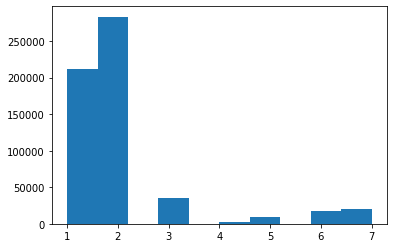

In [36]:
plt.hist(df['Cover_Type'])

(array([ 0.5,  1.5,  2.5,  3.5,  4.5,  5.5,  6.5,  7.5,  8.5,  9.5, 10.5]),
 [Text(0, 0.5, 'Elevation'),
  Text(0, 1.5, 'Aspect'),
  Text(0, 2.5, 'Slope'),
  Text(0, 3.5, 'Horizontal_Distance_To_Hydrology'),
  Text(0, 4.5, 'Vertical_Distance_To_Hydrology'),
  Text(0, 5.5, 'Horizontal_Distance_To_Roadways'),
  Text(0, 6.5, 'Hillshade_9am'),
  Text(0, 7.5, 'Hillshade_Noon'),
  Text(0, 8.5, 'Hillshade_3pm'),
  Text(0, 9.5, 'Horizontal_Distance_To_Fire_Points'),
  Text(0, 10.5, 'Cover_Type')])

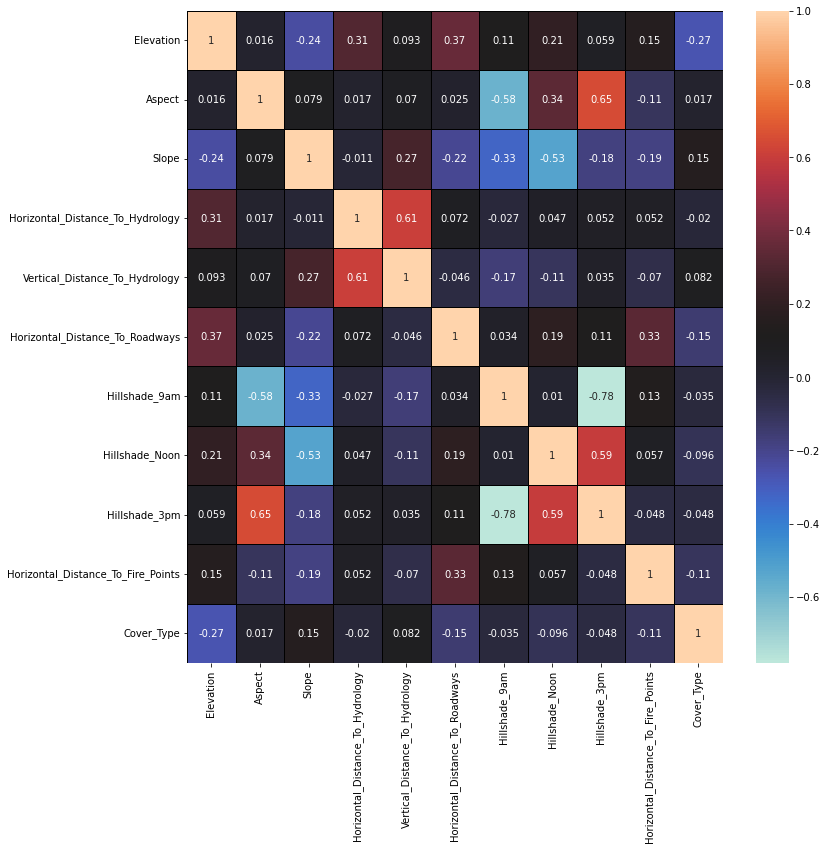

In [38]:
plt.figure(figsize=(12,12))
sns.heatmap(df.corr(), linewidths = 0.5, annot=True, linecolor = 'black', cmap='icefire')
plt.xticks(rotation=90)
plt.yticks(rotation=0)

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10]),
 [Text(0, 0, 'Elevation'),
  Text(1, 0, 'Aspect'),
  Text(2, 0, 'Slope'),
  Text(3, 0, 'Horizontal_Distance_To_Hydrology'),
  Text(4, 0, 'Vertical_Distance_To_Hydrology'),
  Text(5, 0, 'Horizontal_Distance_To_Roadways'),
  Text(6, 0, 'Hillshade_9am'),
  Text(7, 0, 'Hillshade_Noon'),
  Text(8, 0, 'Hillshade_3pm'),
  Text(9, 0, 'Horizontal_Distance_To_Fire_Points'),
  Text(10, 0, 'Cover_Type')])

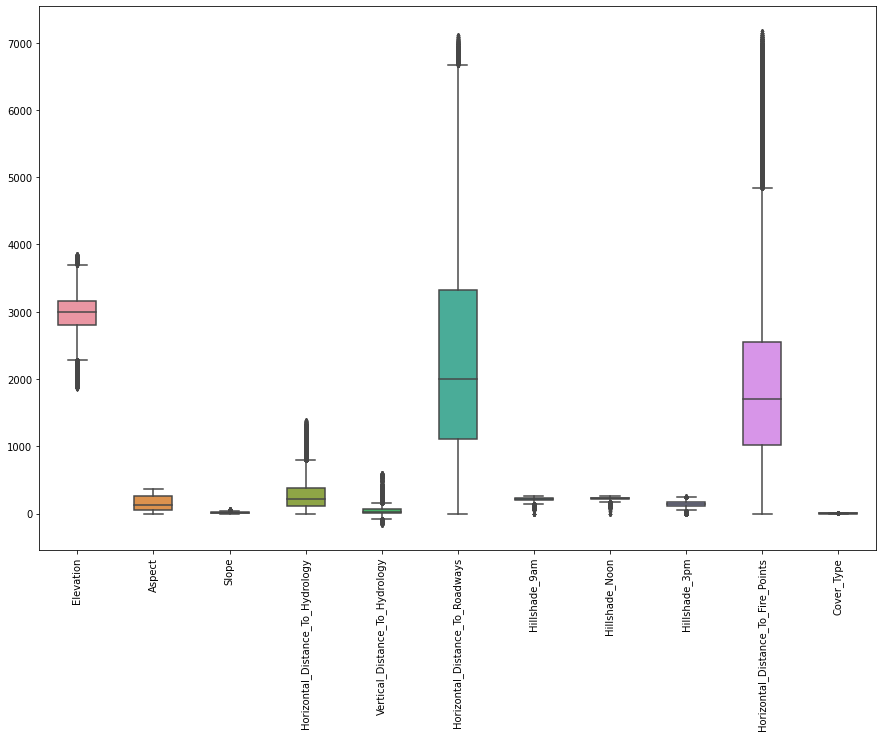

In [43]:
fig, ax = plt.subplots(figsize=(15,10))
sns.boxplot(data=df, width= 0.5,ax=ax,  fliersize=3)
plt.xticks(rotation=90)

In [46]:
x=df.drop('Cover_Type',axis=1)
y=df['Cover_Type']

In [48]:
x.head()

,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Hillshade_3pm,Horizontal_Distance_To_Fire_Points
0,2596,51,3,258,0,510,221,232,148,6279
1,2590,56,2,212,-6,390,220,235,151,6225
2,2804,139,9,268,65,3180,234,238,135,6121
3,2785,155,18,242,118,3090,238,238,122,6211
4,2595,45,2,153,-1,391,220,234,150,6172


In [87]:
sc=StandardScaler()
x_scale= sc.fit_transform(x)

In [88]:
x_scale

array([[-1.29780509, -0.93515698, -1.48281978, ...,  0.43914331,
         0.1429604 ,  3.24628306],
       [-1.31923485, -0.89047967, -1.61636259, ...,  0.59089851,
         0.22134157,  3.20550354],
       [-0.5549068 , -0.14883628, -0.68156292, ...,  0.74265371,
        -0.19669136,  3.1269652 ],
       ...,
       [-2.04784663,  0.02987297,  0.38677957, ...,  0.89440891,
        -0.32732665, -0.85054846],
       [-2.05498988,  0.12816306,  0.11969395, ...,  1.09674918,
         0.01232511, -0.8429967 ],
       [-2.05856151,  0.08348575, -0.14739167, ...,  1.04616411,
        -0.03992901, -0.83468976]])

In [89]:
vif= pd.DataFrame()
vif["vif"] = [variance_inflation_factor(x_scale,i) for i in range(x_scale.shape[1])]
vif["Features"] = x.columns

In [90]:
vif

,vif,Features
0,1.337095,Elevation
1,1.863213,Aspect
2,6.920556,Slope
3,1.809884,Horizontal_Distance_To_Hydrology
4,1.828857,Vertical_Distance_To_Hydrology
5,1.301477,Horizontal_Distance_To_Roadways
6,106.330584,Hillshade_9am
7,38.699649,Hillshade_Noon
8,146.364473,Hillshade_3pm
9,1.163598,Horizontal_Distance_To_Fire_Points


In [61]:
from pandas_profiling import ProfileReport
ProfileReport(df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [91]:
vif

,vif,Features
0,1.337095,Elevation
1,1.863213,Aspect
2,6.920556,Slope
3,1.809884,Horizontal_Distance_To_Hydrology
4,1.828857,Vertical_Distance_To_Hydrology
5,1.301477,Horizontal_Distance_To_Roadways
6,106.330584,Hillshade_9am
7,38.699649,Hillshade_Noon
8,146.364473,Hillshade_3pm
9,1.163598,Horizontal_Distance_To_Fire_Points


as you can see there are three independent variables which is having multi collinearity,
so just for experiment purpose I will be checking train, test and check the accuracy score

In [72]:
x_train,x_test,y_train,y_test= train_test_split(x_scale,y,test_size=0.25,random_state=42)

In [73]:
lr= LogisticRegression()
lr.fit(x_train, y_train)

C:\Users\Jocelyn\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


LogisticRegression()

In [74]:
import pickle
with open( 'modelForPrediction.sav', 'wb') as f:
    pickle.dump(lr,f)
    
with open('standardScalar.sav', 'wb') as f:
    pickle.dump(sc,f)

In [75]:
y_pred=lr.predict(x_test)

In [76]:
accuracy = accuracy_score(y_test,y_pred)
accuracy

0.696364274748198

In [77]:
conf_mat = confusion_matrix(y_test,y_pred)
conf_mat

array([[37001, 14971,     1,     0,     0,     0,  1033],
       [13867, 55806,   871,     0,     0,   214,    18],
       [    0,  1910,  6168,   121,     0,   710,     0],
       [    0,     4,   439,   150,     0,    58,     0],
       [    3,  2464,     6,     0,     0,     0,     0],
       [    0,  1394,  2263,    23,     0,   693,     0],
       [ 3661,    73,     0,     0,     0,     0,  1331]], dtype=int64)

In [79]:
#classification report
from sklearn.metrics import classification_report
print(classification_report(y_test,y_pred))

C:\Users\Jocelyn\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\Jocelyn\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\Jocelyn\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(avera

              precision    recall  f1-score   support

           1       0.68      0.70      0.69     53006
           2       0.73      0.79      0.76     70776
           3       0.63      0.69      0.66      8909
           4       0.51      0.23      0.32       651
           5       0.00      0.00      0.00      2473
           6       0.41      0.16      0.23      4373
           7       0.56      0.26      0.36      5065

    accuracy                           0.70    145253
   macro avg       0.50      0.40      0.43    145253
weighted avg       0.68      0.70      0.68    145253



In [92]:
x1=df.drop('Hillshade_3pm',axis=1)
x1.head()

,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Horizontal_Distance_To_Fire_Points,Cover_Type
0,2596,51,3,258,0,510,221,232,6279,5
1,2590,56,2,212,-6,390,220,235,6225,5
2,2804,139,9,268,65,3180,234,238,6121,2
3,2785,155,18,242,118,3090,238,238,6211,2
4,2595,45,2,153,-1,391,220,234,6172,5


In [93]:
x_scale1= sc.fit_transform(x1)

In [95]:
vif1=pd.DataFrame()
vif1["vif"] = [variance_inflation_factor(x_scale1,i) for i in range(x_scale1.shape[1])]
vif1["Features"] = x.columns

In [96]:
vif1

,vif,Features
0,1.404413,Elevation
1,1.863826,Aspect
2,1.819065,Slope
3,1.808562,Horizontal_Distance_To_Hydrology
4,1.835737,Vertical_Distance_To_Hydrology
5,1.301188,Horizontal_Distance_To_Roadways
6,1.751049,Hillshade_9am
7,1.760762,Hillshade_Noon
8,1.165981,Hillshade_3pm
9,1.102768,Horizontal_Distance_To_Fire_Points


In [97]:
x_train,x_test,y_train,y_test= train_test_split(x_scale1,y,test_size=0.25,random_state=42)

In [98]:
lr1= LogisticRegression()
lr1.fit(x_train, y_train)

C:\Users\Jocelyn\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


LogisticRegression()

In [99]:
y_pred=lr.predict(x_test)

In [100]:
accuracy = accuracy_score(y_test,y_pred)
accuracy

0.6387062573578515

In [101]:
conf_mat = confusion_matrix(y_test,y_pred)
conf_mat

array([[35373, 15196,    43,     0,     0,   769,  1625],
       [14567, 49695,  1678,     0,     0,  4800,    36],
       [    0,  1926,  5072,   309,     0,  1602,     0],
       [    0,     7,   166,   291,     0,   187,     0],
       [   52,  2341,     0,     0,     0,    80,     0],
       [    0,  2015,  1538,   253,     0,   567,     0],
       [ 3181,   108,     0,     0,     0,     0,  1776]], dtype=int64)